#Installing required libraries:

In [1]:
!sudo apt install tesseract-ocr
!pip install pytesseract

Reading package lists... Done
Building dependency tree       
Reading state information... Done
The following additional packages will be installed:
  tesseract-ocr-eng tesseract-ocr-osd
The following NEW packages will be installed:
  tesseract-ocr tesseract-ocr-eng tesseract-ocr-osd
0 upgraded, 3 newly installed, 0 to remove and 31 not upgraded.
Need to get 4,795 kB of archives.
After this operation, 15.8 MB of additional disk space will be used.
Get:1 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-eng all 4.00~git24-0e00fe6-1.2 [1,588 kB]
Get:2 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr-osd all 4.00~git24-0e00fe6-1.2 [2,989 kB]
Get:3 http://archive.ubuntu.com/ubuntu bionic/universe amd64 tesseract-ocr amd64 4.00~git2288-10f4998a-2 [218 kB]
Fetched 4,795 kB in 3s (1,411 kB/s)
debconf: unable to initialize frontend: Dialog
debconf: (No usable dialog-like program is installed, so the dialog based frontend cannot be used. at /usr/share/perl

# Importing relevant libraries and viewing the image that needs to be worked upon:

In [0]:
import pytesseract
import cv2
from google.colab.patches import cv2_imshow       # Although cv2.imshow() should work, it crashes in google colab. Hence, we import this library

#Uploading images that need to be scanned:

In [14]:
from google.colab import files
files.upload()

Saving 5.jpg to 5.jpg


{'5.jpg': b'\xff\xd8\xff\xe1\x01\\Exif\x00\x00MM\x00*\x00\x00\x00\x08\x00\x07\x87i\x00\x04\x00\x00\x00\x01\x00\x00\x00\x85\x01\x12\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x01\x10\x00\x02\x00\x00\x00\n\x00\x00\x00b\x01\x01\x00\x03\x00\x00\x00\x01\x05\xa0\x00\x00\x012\x00\x02\x00\x00\x00\x14\x00\x00\x00l\x01\x0f\x00\x02\x00\x00\x00\x05\x00\x00\x00\x80\x01\x00\x00\x03\x00\x00\x00\x01\n\x00\x00\x00\x00\x00\x00\x00vivo 1601\x002019:09:12 10:42:16\x00vivo\x00\x00\x06\x92\t\x00\x03\x00\x00\x00\x01\x00\x00\x00\x00\xa4\x03\x00\x03\x00\x00\x00\x01\x00\x00\x00\x00\x82\x9a\x00\x05\x00\x00\x00\x01\x00\x00\x00\xd3\x92\x08\x00\x04\x00\x00\x00\x01\x00\x00\x00\x00\x88\'\x00\x03\x00\x00\x00\x01\x00y\x00\x00\x82\x9d\x00\x05\x00\x00\x00\x01\x00\x00\x00\xdb\x00\x00\x00\x00\x00\x00\x00\x03\x00\x00\'\x10\x00\x00U\xf0\x00\x00\'\x10\x00\x06\x01\x12\x00\x03\x00\x00\x00\x01\x00\x01\x00\x00\x01\x01\x00\x03\x00\x00\x00\x01\x05\xa0\x00\x00\x01\x10\x00\x02\x00\x00\x00\n\x00\x00\x011\x012\x00\x02\x00\x00\x00\x14\x00\

# Writing a function which takes image as an input and returns the extracted text

In [0]:
def extract(image):
    img = cv2.imread(image)
    cv2_imshow(img)
    text = pytesseract.image_to_string(img)
    print(text)

# Extracting text from the image:

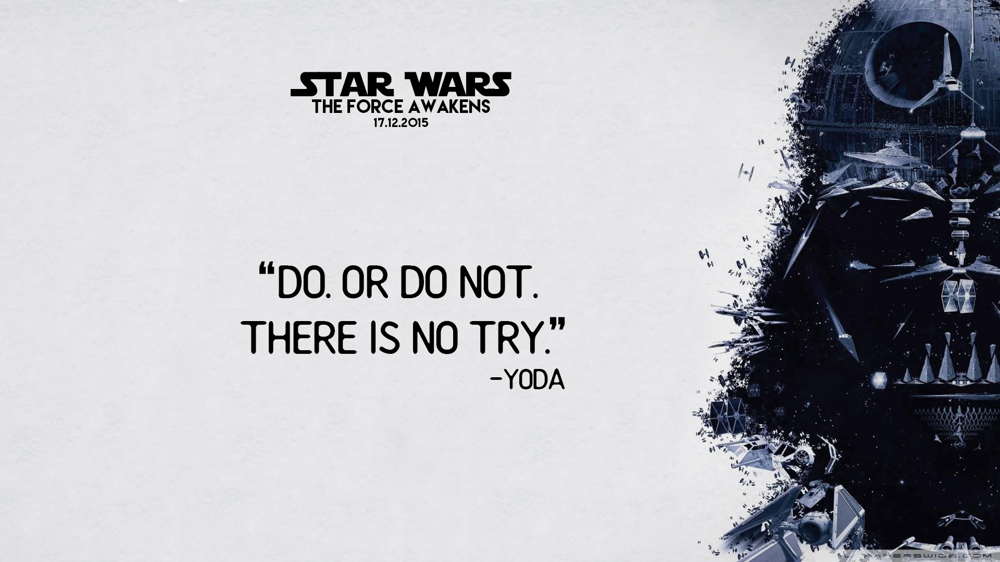

THE FORCE AWAKENS

17.12.2015

“DO. OR DO NOT.
THERE IS NO TRY.”

-YODA


In [11]:
extract("star wars.jpg")

Couldn't capture Star Wars (Mostly for the font style), no errors in anything else.

# Trying the same on other image:

Now let us try it on reading something like a restaurant bill:

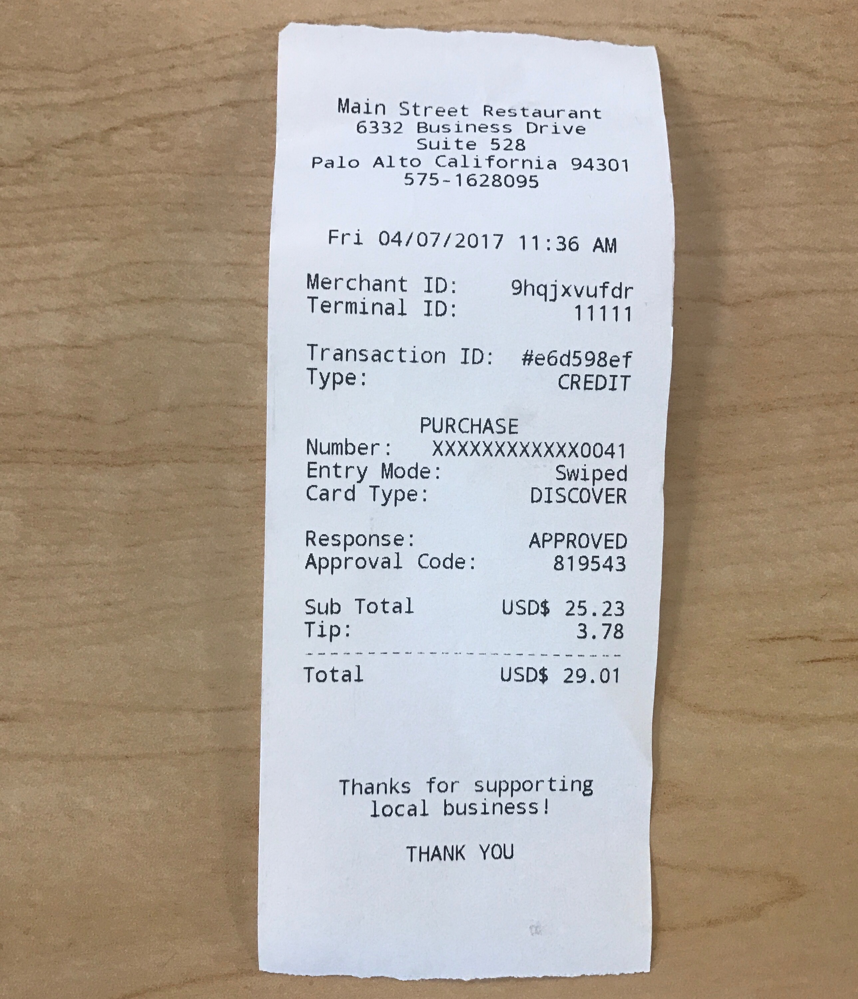

Main Street Restaurant
6332 Business Drive
Suite 528
Palo Alto California 94301
575-1628095

Fri 04/07/2017 11:36 AM

Merchant ID: 9hqjxvufdr
Terminal ID: (ACY

Transaction ID: #e6d598ef
Type: CREDIT

PURCHASE
Number : AXXXXXXXXXXXOO4 1
Entry Mode: Swiped
Card Type: DISCOVER

Response: APPROVED
Approval Code: 819543

Sub Total USD$ 25.23

pe

USD$ 29.01

Thanks for supporting
local business!

THANK YOU


In [12]:
extract("2.JPG")

Now here we can see that it has got few things wrong as opposed to the case above.

We can see that the Terminal ID is captured wrong, the four-digit number on the end of the credit card is wrongly read as "O" instead of "0". It even added a space between 4 and 1.
Furthermore couldn't capture the tip as well.

Now we can assume that these errors have occurred because of the complexities in the image, such as the folded bill, font, etc.

Let us try this on something cruder like a *kaccha* bill:

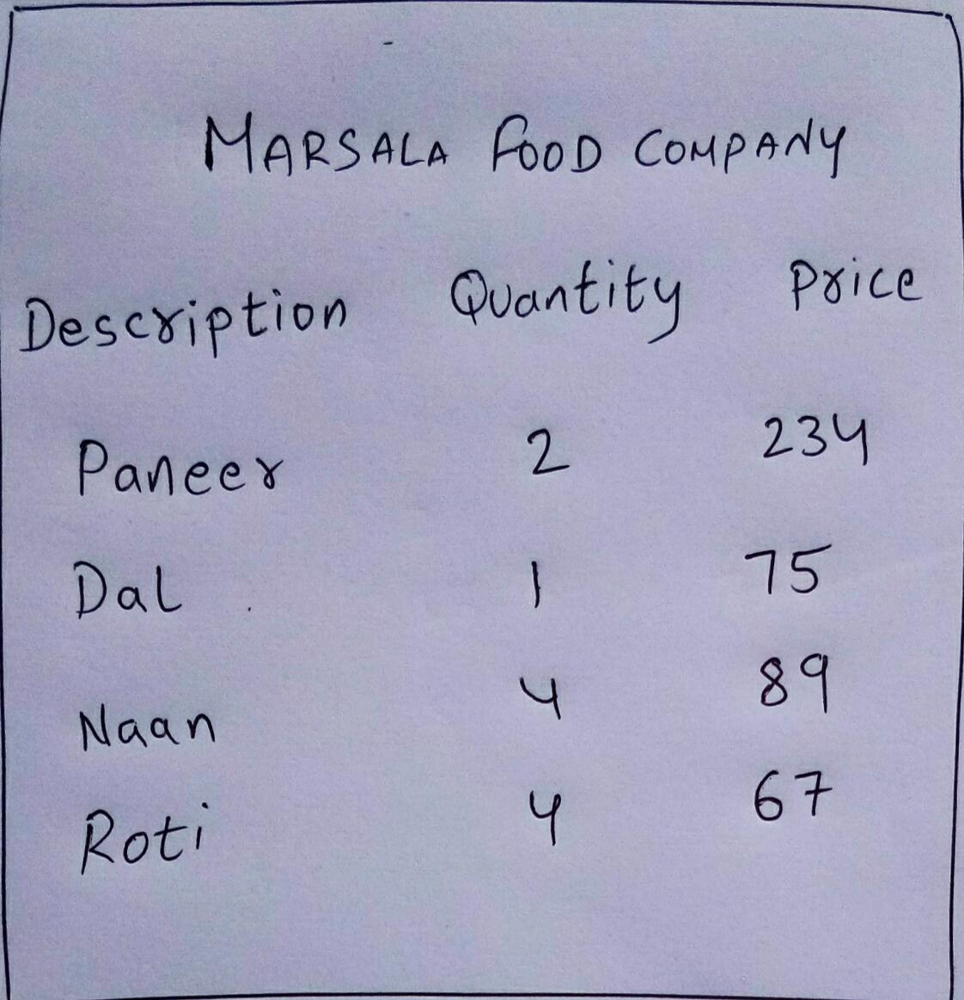

Marsata Pood Company

Deseviption
Paneer
Dal

Naan

Roti

Quant iby

&

J
uy

.

Price

BS")

com
84
6t


In [15]:
extract("5.jpg")

Now we can see that with a handwritten bill it goofed up even further. This is where we find a limitation of a pre-trained model like Pytesseract. For further accuracy, we need to train the model with images of our own.